Final Project for Purdue ECE 57000 (Fall 2024)

In [1]:
import sys
import warnings
from pathlib import Path
from typing import Dict, Any

!pip install opencv-python matplotlib timm rich

import cv2
import numpy as np
import torch
import torch.nn
import torch.utils.data
import torchvision
import matplotlib
import matplotlib.pyplot as plt

!{sys.executable} -m pip install git+https://github.com/ChaoningZhang/MobileSAM.git
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=FutureWarning)
    warnings.filterwarnings("ignore", category=UserWarning)
    from mobile_sam import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

# Edit python path to include src
sys.path.append("src")
import utils


[notice] A new release of pip is available: 23.3.1 -> 24.3.1
[notice] To update, run: python -m pip install --upgrade pip
  Cloning https://github.com/ChaoningZhang/MobileSAM.git to /tmp/pip-req-build-ven7e0my
  Running command git clone --filter=blob:none --quiet https://github.com/ChaoningZhang/MobileSAM.git /tmp/pip-req-build-ven7e0my
  Resolved https://github.com/ChaoningZhang/MobileSAM.git to commit c12dd83cbe26dffdcc6a0f9e7be2f6fb024df0ed
  Preparing metadata (setup.py) ... done

[notice] A new release of pip is available: 23.3.1 -> 24.3.1
[notice] To update, run: python -m pip install --upgrade pip


In [2]:
# Print setup
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("OpenCV version:", cv2.__version__)
print("Numpy version:", np.__version__)
print("Matplotlib version:", matplotlib.__version__)
print("Using device:", utils.get_device())

PyTorch version: 2.1.0+cu118
Torchvision version: 0.16.0+cu118
OpenCV version: 4.10.0
Numpy version: 1.24.1
Matplotlib version: 3.9.2
Using device: cuda


In [3]:
# Download teacher model checkpoint if it does not exist
OG_VIT_CHECKPOINT_PATH = "weights/sam_vit_h_4b8939.pth"
OG_CHECKPOINT_URL = (
    "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth"
)

# Teacher model checkpoint is used for mask decoder and prompt encoder
# This can take a while, it's 2.56 GB
if not Path(OG_VIT_CHECKPOINT_PATH).exists():
    print("Downloading teacher model checkpoint from: ", OG_VIT_CHECKPOINT_PATH)
    !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth -P weights

### NOTE: SEE src/train.py for the training script
This notebook is for demonstration of the training results. We will take a few sample images and use these to show examples of the custom trained model performance. We will then calculate the mIoU (mean Intersection over Union) as a more rigorous comparison of performance.

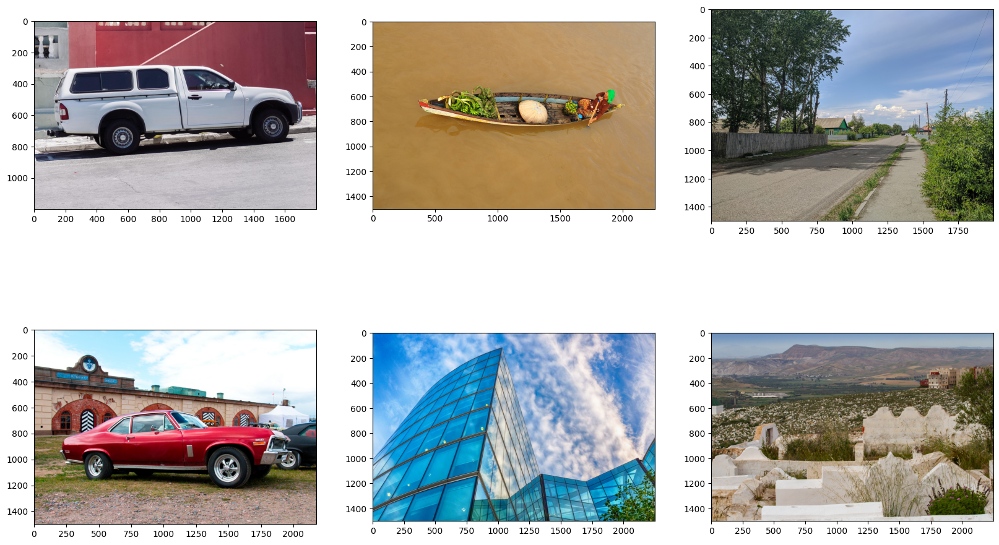

In [4]:
# Look at a few of the input image samples (note that the images are not all the same size)
images = [
    "samples/truck.jpg",
    "samples/car.jpg",
    "samples/boat.jpg",
    "samples/building.jpg",
    "samples/road.jpg",
    "samples/landscape.jpg",
]

fig, ax = plt.subplots(2, 3)
fig.set_size_inches(20, 12)

for i, image in enumerate(images):
    r = i % 2
    c = i // 2
    image = cv2.imread(image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    ax[r][c].imshow(image)
fig.show()

The model that was trained, is just the image encoder component of the full SAM model. Thus, we need to merge the checkpoint with the original SAM model checkpoint.
The merged model is much smaller, 40MB compared to 2.56GB!

In [5]:
CUSTOM_VIT_CHECKPOINT_PATH = "weights/ece570_x2.pth"
VIT_MERGED_CHECKPOINT_PATH = "weights/ece570_model_merged.pth"
with open(OG_VIT_CHECKPOINT_PATH, "rb") as f:
    teacher_state_dict = torch.load(f, weights_only=True)
with open(CUSTOM_VIT_CHECKPOINT_PATH, "rb") as f:
    student_state_dict = torch.load(f, weights_only=True)
merged_state_dict: Dict[str, Any] = {}
# Merge the two state dicts (replace the teacher image encoder with the student image encoder)
for key in teacher_state_dict.keys():
    if "image_encoder" not in key:
        merged_state_dict[key] = teacher_state_dict[key]
for key in student_state_dict.keys():
    if "image_encoder" in key:
        merged_state_dict[key] = student_state_dict[key]
# Save the merged state dict
with open(VIT_MERGED_CHECKPOINT_PATH, "wb") as f:
    torch.save(merged_state_dict, f)

/usr/local/lib/python3.10/dist-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


In [6]:
# Helper function(s) for visualization
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x["area"]), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones(
        (
            sorted_anns[0]["segmentation"].shape[0],
            sorted_anns[0]["segmentation"].shape[1],
            4,
        )
    )
    img[:, :, 3] = 0
    for ann in sorted_anns:
        m = ann["segmentation"]
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

In [7]:
# Use the SAM model Automatic Mask Generator to generate the mask and point_coords
OG_MODEL_TYPE = "vit_h"
print(f"Loading the original SAM model: {OG_MODEL_TYPE}")
og_sam = sam_model_registry[OG_MODEL_TYPE](checkpoint=OG_VIT_CHECKPOINT_PATH)
og_sam.to(utils.get_device())
og_sam.eval()
print("Generating masks using the original SAM model")
generator = SamAutomaticMaskGenerator(og_sam)
og_masks = []
for i, image_path in enumerate(images):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    masks = generator.generate(image)
    num_masks = len(masks)
    print(f"Image: {image_path}, num masks: {num_masks}")
    og_masks.append(masks)

Loading the original SAM model: vit_h
Generating masks using the original SAM model
Image: samples/truck.jpg, num masks: 77
Image: samples/car.jpg, num masks: 102
Image: samples/boat.jpg, num masks: 28
Image: samples/building.jpg, num masks: 98
Image: samples/road.jpg, num masks: 51
Image: samples/landscape.jpg, num masks: 90


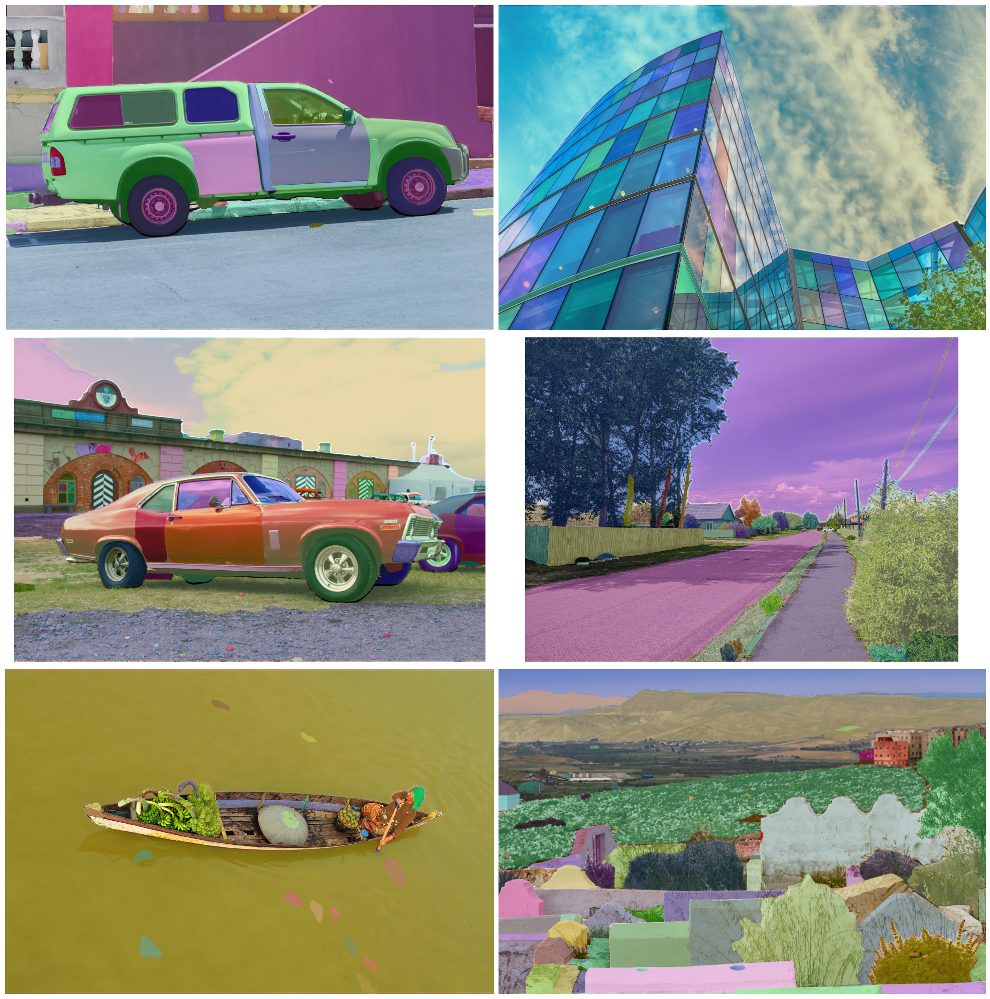

In [8]:
# Show the masks generated by the original SAM model
fig, ax = plt.subplots(3, 2, figsize=(20, 20))
i = 0
for img_pth, masks in zip(images, og_masks):
    r = i % 3
    c = i // 3
    image = cv2.imread(img_pth)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    ax[r][c].imshow(image)
    plt.sca(ax[r][c])
    plt.gca().axis("off")
    show_anns(masks)
    i += 1
plt.tight_layout()
plt.show()

In [9]:
# Helper function used to calculate the IoU (Intersection over Union)
def calculate_iou(pred, target):
    intersection = np.logical_and(target, pred)
    union = np.logical_or(target, pred)
    iou_score = np.sum(intersection) / np.sum(union)
    return iou_score

In [10]:
# Helper functions to visualize masks and points
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30 / 255, 144 / 255, 255 / 255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels == 1]
    neg_points = coords[labels == 0]
    ax.scatter(
        pos_points[:, 0],
        pos_points[:, 1],
        color="green",
        marker="*",
        s=marker_size,
        edgecolor="white",
        linewidth=1.25,
    )
    ax.scatter(
        neg_points[:, 0],
        neg_points[:, 1],
        color="red",
        marker="*",
        s=marker_size,
        edgecolor="white",
        linewidth=1.25,
    )

Loading the original SAM model: vit_t
Generating masks using the ViT Tiny SAM model


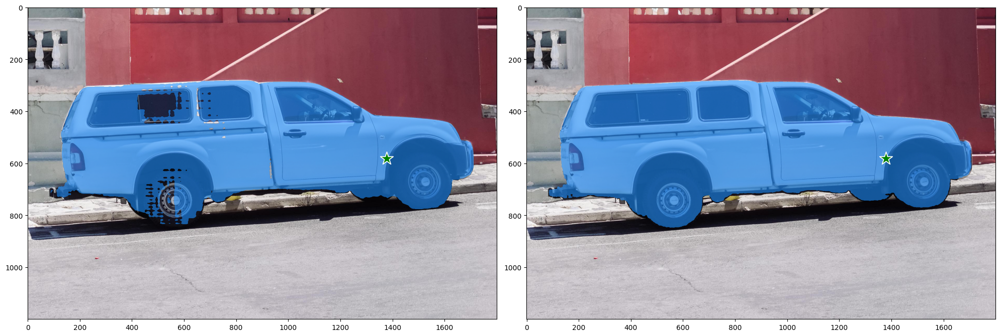

mIoU: 0.63


In [11]:
# Now load the custom trained ViT Tiny model so we can generate masks using it and compare/calculate the mIoU
TINY_MODEL_TYPE = "vit_t"
print(f"Loading the original SAM model: {TINY_MODEL_TYPE}")
tiny_sam = sam_model_registry[TINY_MODEL_TYPE](checkpoint=VIT_MERGED_CHECKPOINT_PATH)
tiny_sam.to(utils.get_device())
tiny_sam.eval()
print("Generating masks using the ViT Tiny SAM model")
predictor = SamPredictor(tiny_sam)
count = 1
accum_iou = 0.0
show_masks = True
for masks, img_path in zip(og_masks, images):
    image = cv2.imread(img_path)
    # ViT Tiny model only accepts RGB (it was only trained on this)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    predictor.set_image(image)
    for mask in masks:
        point_coords = np.array(mask["point_coords"])
        point_label = np.array([1])
        tiny_mask, _, _ = predictor.predict(
            point_coords=point_coords, point_labels=point_label, multimask_output=False
        )
        tiny_mask.squeeze(0)
        og_seg_mask = mask["segmentation"]
        tiny_seg_mask = tiny_mask.squeeze(0)
        iou = calculate_iou(tiny_seg_mask, og_seg_mask)
        count += 1
        accum_iou += iou

        # DEBUG (show a single mask)
        if show_masks:
            fig, ax = plt.subplots(1, 2, figsize=(20, 20))
            ax[0].imshow(image)
            show_mask(tiny_seg_mask, ax[0])
            show_points(point_coords, point_label, ax[0])
            ax[1].imshow(image)
            show_mask(og_seg_mask, ax[1])
            show_points(point_coords, point_label, ax[1])
            plt.tight_layout()
            fig.show()
            plt.show()
            show_masks = False

meanIoU = accum_iou / count
print(f"mIoU: {meanIoU:.2f}")